In [1]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (30.0, 20.0)
matplotlib.rcParams['image.cmap'] = 'gray'

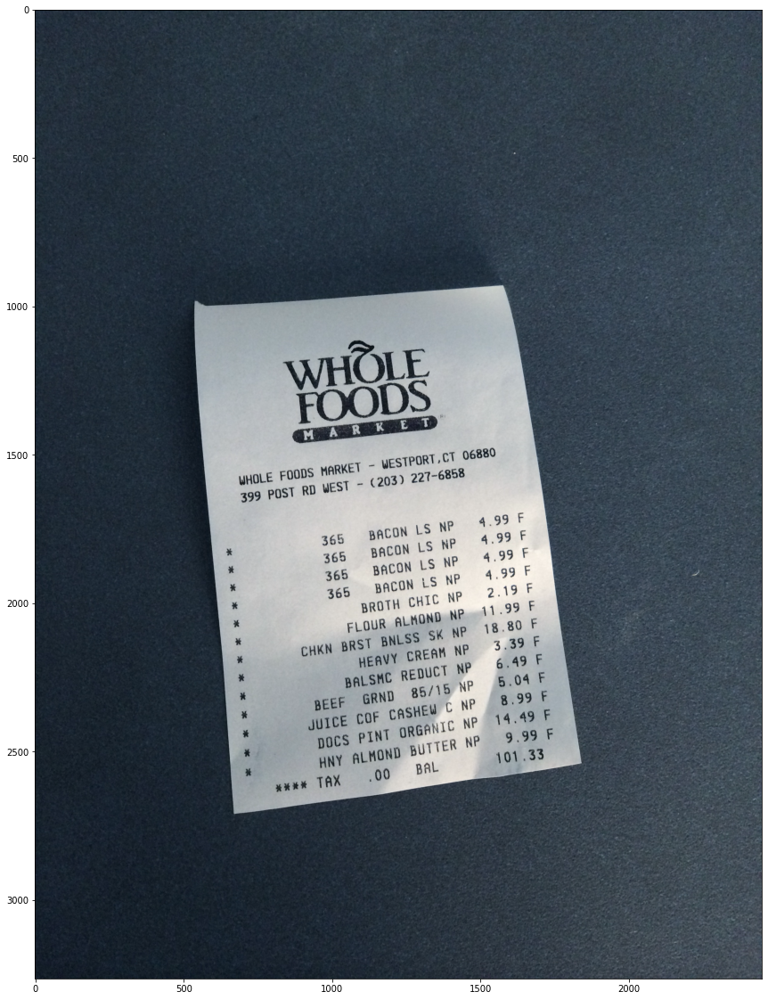

In [3]:
image = cv2.imread("MicrosoftTeams-image (7).png")
plt.imshow(image)

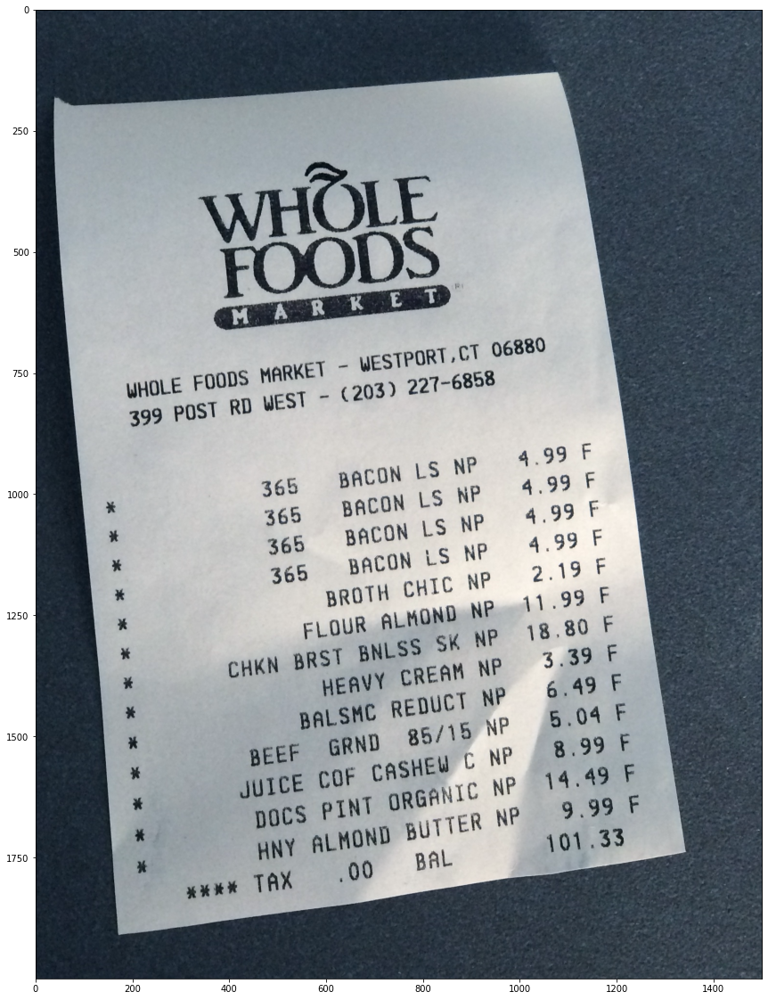

In [4]:
# Cropping
crop = image[800:2800,500:2000]
plt.imshow(crop)

# Gray_scale

(2000, 1500)


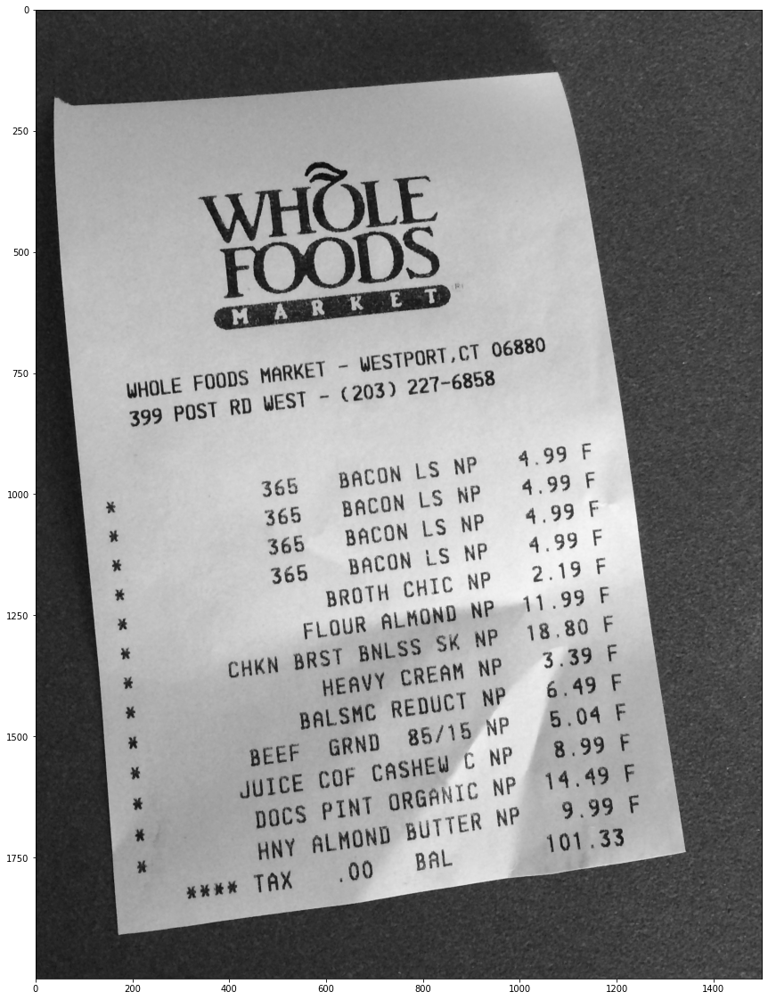

In [5]:
imageGray = cv2.cvtColor(crop,cv2.COLOR_BGR2GRAY)
plt.imshow(imageGray)
print(imageGray.shape)

# Thershold

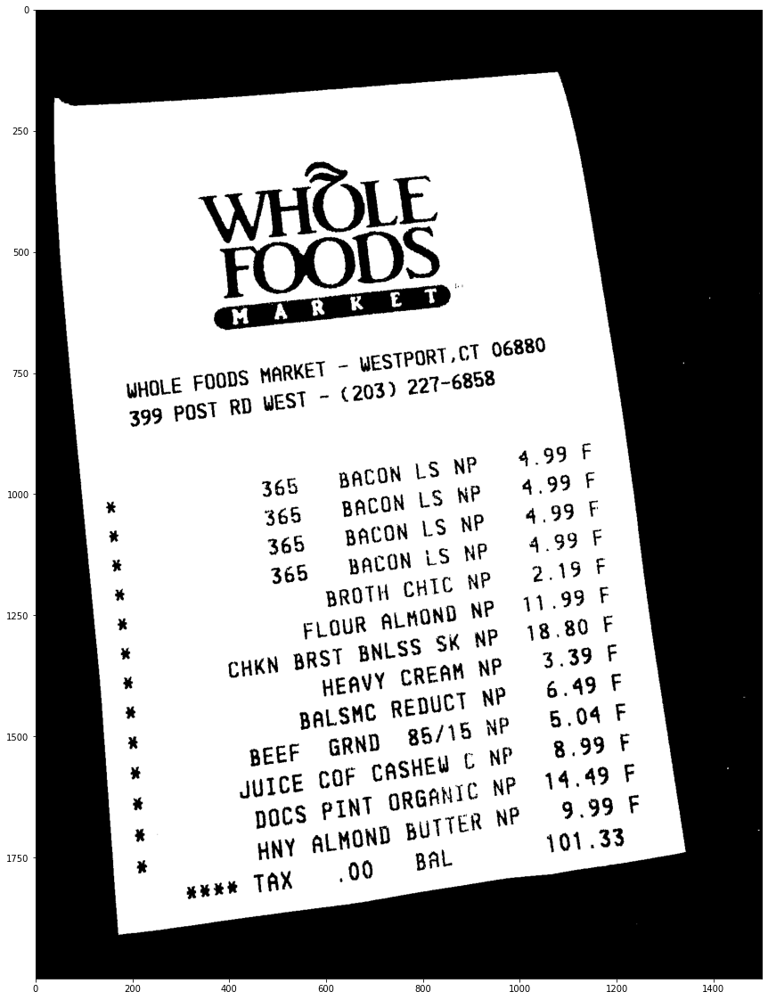

In [6]:
#Binary
img_bin = cv2.threshold(imageGray, 127, 255, cv2.THRESH_BINARY)[1]
plt.imshow(img_bin)

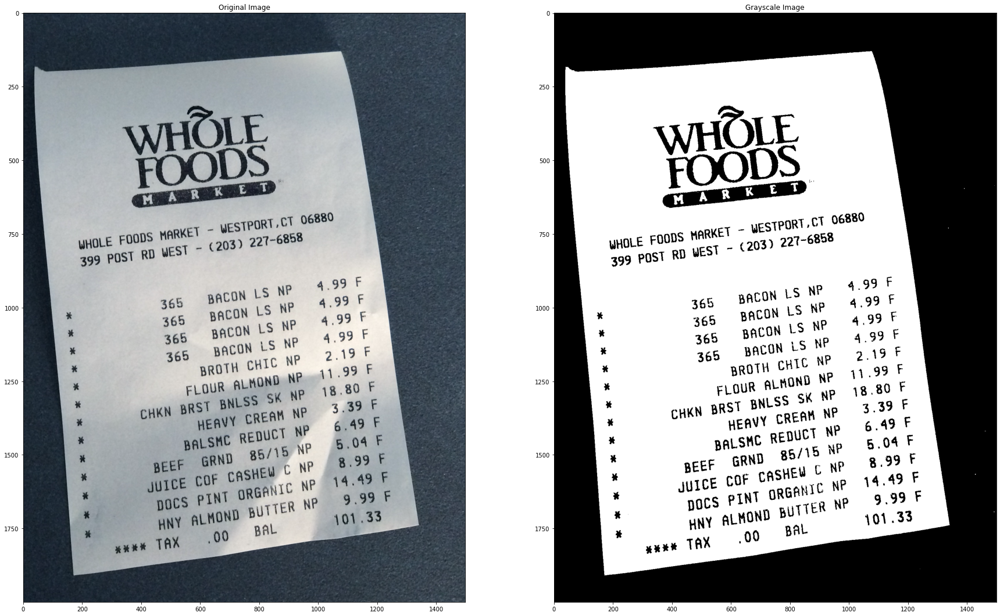

In [7]:
plt.figure()
plt.subplot(121)
plt.imshow(crop)
plt.title("Original Image");
plt.subplot(122)
plt.imshow(img_bin)
plt.title("Grayscale Image");

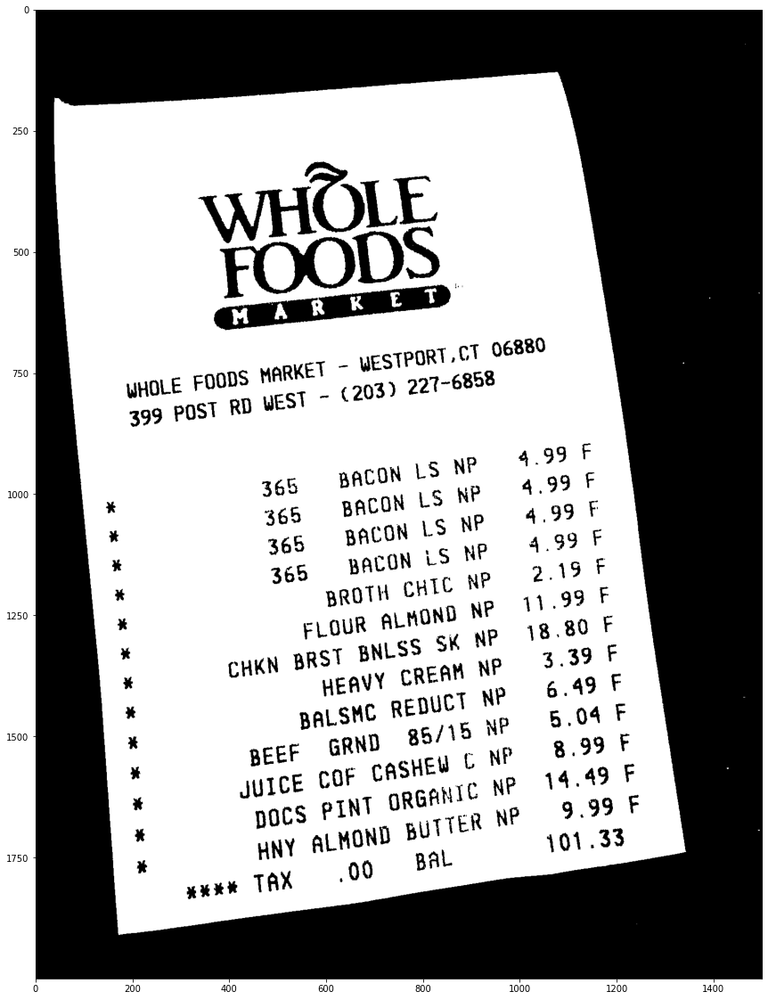

In [8]:
#OTSU
img_bin = cv2.threshold(imageGray, 127, 255, cv2.THRESH_BINARY|cv2.THRESH_OTSU)[1]
plt.imshow(img_bin)

# DPI - Resize

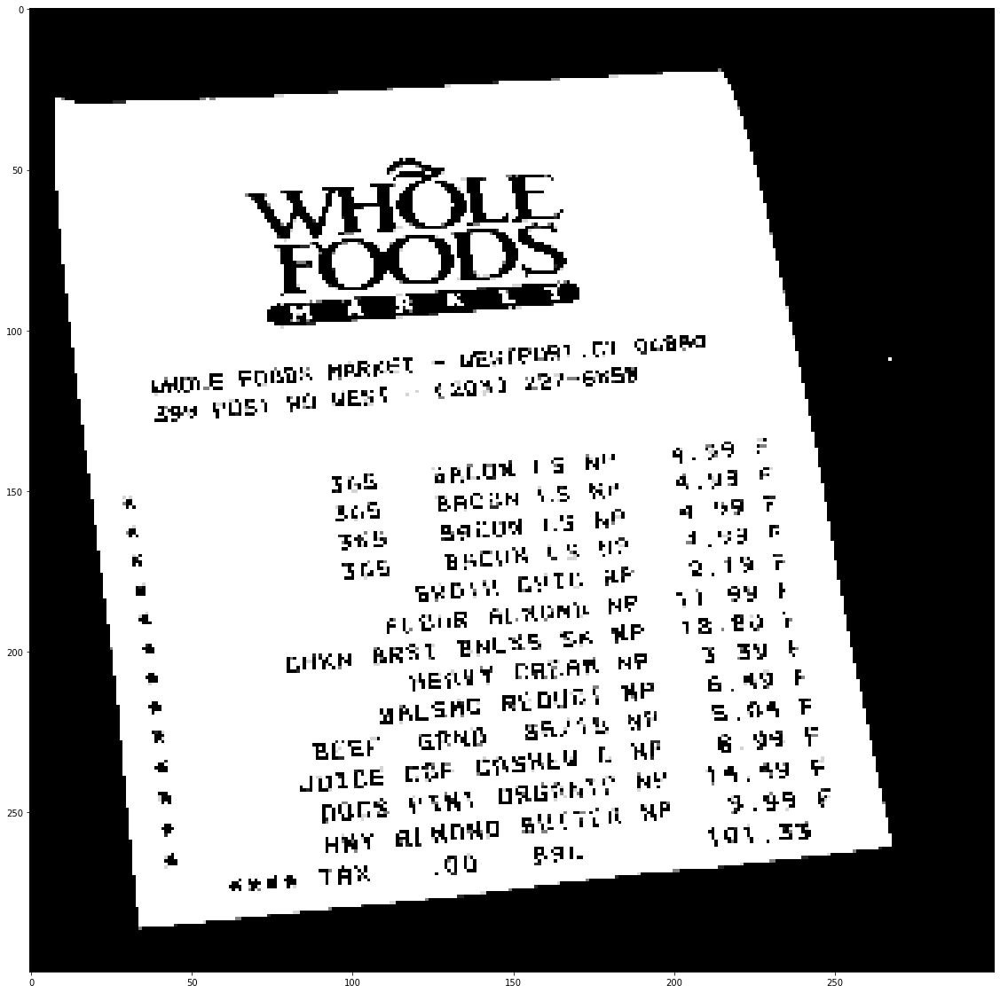

In [9]:
resized = cv2.resize(img_bin,(300,300))
# cv.imshow('Resized',resized)
plt.imshow(resized)

# Contours

# RETR_LIST

In [10]:
contours, hierarchy = cv2.findContours(img_bin, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# print(type(contours))
# print(len(contours))

In [11]:
print("Number of contours found = {}".format(len(contours)))
print("\nHierarchy : \n{}".format(hierarchy))

Number of contours found = 619

Hierarchy : 
[[[  1  -1  -1  -1]
  [  2   0  -1  -1]
  [  3   1  -1  -1]
  ...
  [617 615  -1  -1]
  [618 616  -1  -1]
  [ -1 617  -1  -1]]]


# Blank_Image

In [12]:
imageCopy = image.copy()
blank_image = np.zeros((imageCopy.shape), dtype='uint8')

# Drawing Contours

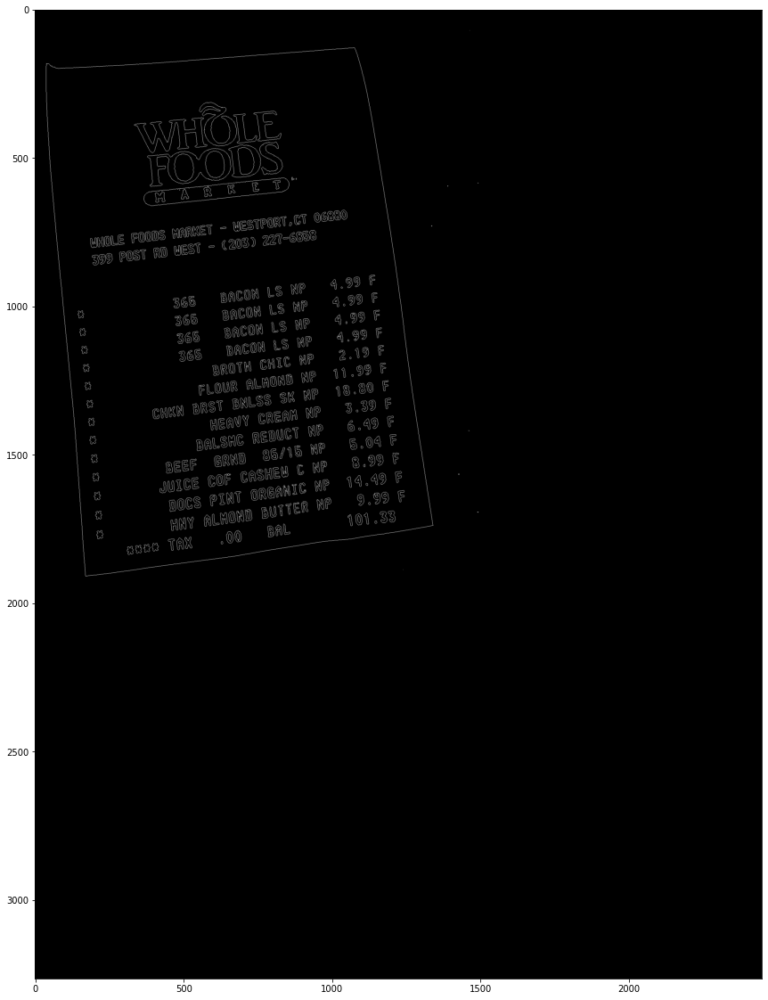

In [13]:
cv2.drawContours(blank_image, contours, -1, (255,255,255), 1);
plt.imshow(blank_image[:,:,::-1])

# Outer Contours

In [14]:
# Find external contours in the image
contours, hierarchy = cv2.findContours(imageGray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))

Number of contours found = 1


In [15]:
# image = imageCopy.copy()
# cv2.drawContours(image, contours, -1, (0,255,0), 3);

# plt.imshow(image[:,:,::-1])

In [16]:
imageCopy_outer = image.copy()
blank_image_outer = np.zeros((imageCopy_outer.shape), dtype='uint8')

In [17]:
cv2.drawContours(blank_image_outer, contours, -1, (255,255,255), 1);
# plt.imshow(blank_image_outer[:,:,::-1])

In [18]:
# Find external contours in the image
contours, hierarchy = cv2.findContours(imageGray, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))

Number of contours found = 1


In [19]:
# image = imageCopy.copy()
# cv2.drawContours(image, contours, -1, (0,255,0), 3);
# plt.imshow(image[:,:,::-1])

In [20]:
imageCopy_RETR_CCOMP = image.copy()
blank_image_RETR_CCOMP = np.zeros((imageCopy_RETR_CCOMP.shape), dtype='uint8')

In [21]:
# cv2.drawContours(imageCopy_RETR_CCOMP, contours, -1, (255,255,255), 1);
# plt.imshow(imageCopy_RETR_CCOMP[:,:,::-1])

In [22]:
# Find external contours in the image
contours, hierarchy = cv2.findContours(imageGray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))

Number of contours found = 1


In [23]:
# image = imageCopy.copy()
# cv2.drawContours(image, contours, -1, (0,255,0), 3);
# plt.imshow(image[:,:,::-1])

In [24]:
imageCopy_tree = image.copy()
blank_image_Tree = np.zeros((imageCopy_tree.shape), dtype='uint8')

In [25]:
# cv2.drawContours(imageCopy_RETR_CCOMP, contours, -1, (255,255,255), 1);
# plt.imshow(imageCopy_RETR_CCOMP[:,:,::-1])

# Dilation

In [26]:
kSize = (3,3)
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)

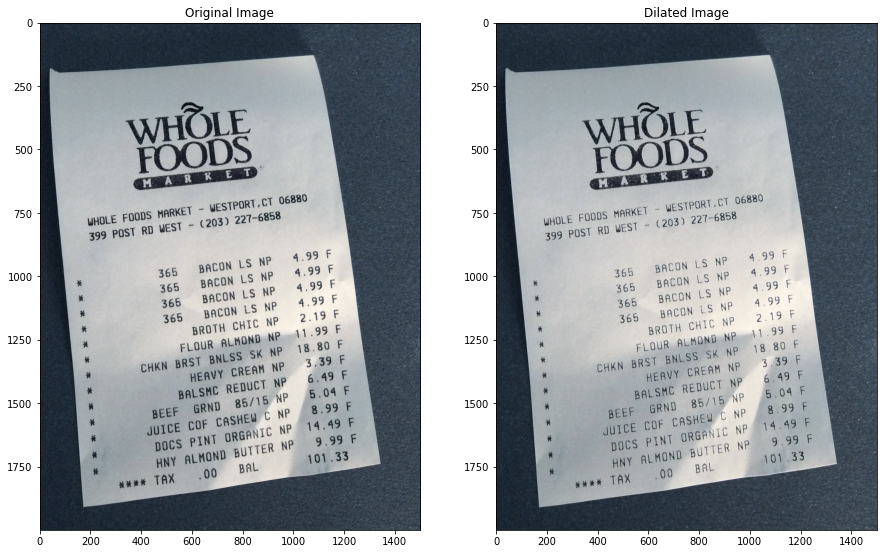

In [27]:
imageDilated = cv2.dilate(crop, kernel1)

plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(crop);plt.title("Original Image")
plt.subplot(122);plt.imshow(imageDilated);plt.title("Dilated Image");

# Based on iteration

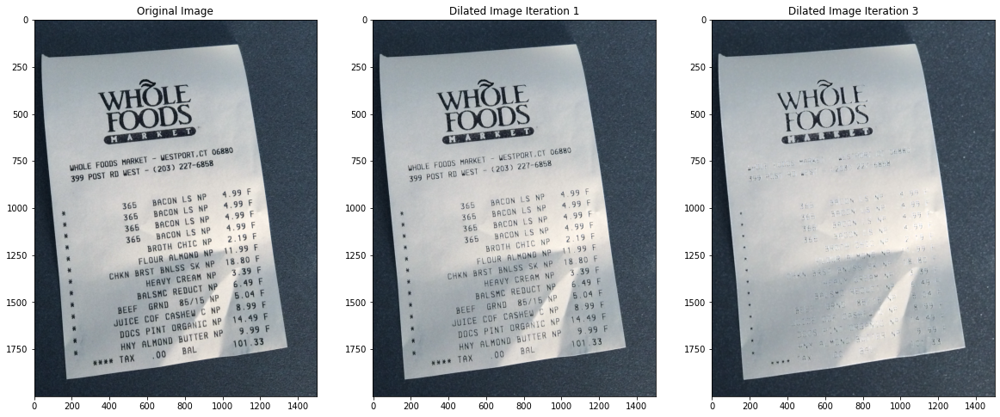

In [28]:
imageDilated1 = cv2.dilate(crop, kernel1, iterations=1)
imageDilated2 = cv2.dilate(crop, kernel1, iterations=3)

plt.figure(figsize=[20,20])
plt.subplot(131);plt.imshow(crop);plt.title("Original Image")
plt.subplot(132);plt.imshow(imageDilated1);plt.title("Dilated Image Iteration 1");
plt.subplot(133);plt.imshow(imageDilated2);plt.title("Dilated Image Iteration 3");

# Erosion

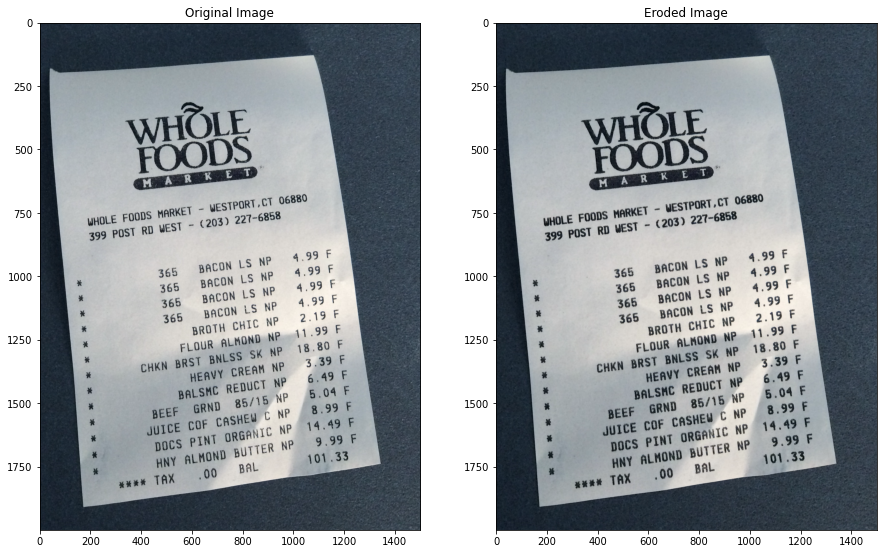

In [29]:
imageEroded = cv2.erode(crop, kernel1)

plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(crop);plt.title("Original Image")
plt.subplot(122);plt.imshow(imageEroded);plt.title("Eroded Image");

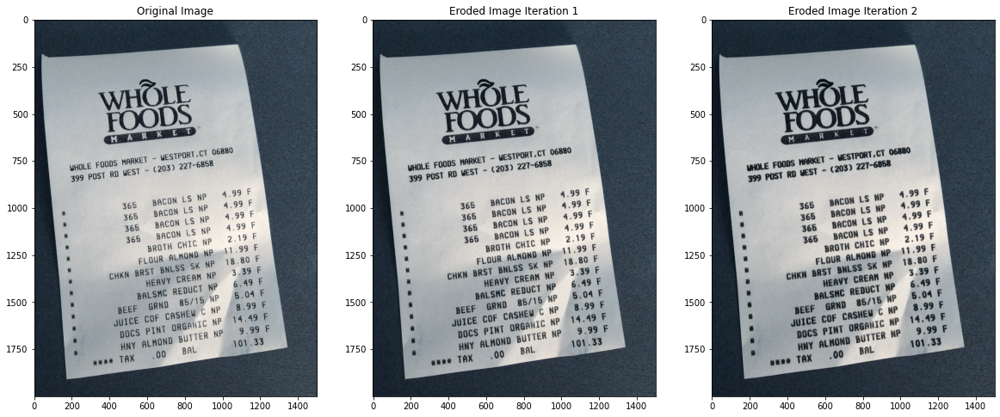

In [30]:
imageDilated1 = cv2.erode(crop, kernel1, iterations=1)
imageDilated2 = cv2.erode(crop, kernel1, iterations=2)

plt.figure(figsize=[20,20])
plt.subplot(131);plt.imshow(crop);plt.title("Original Image")
plt.subplot(132);plt.imshow(imageDilated1);plt.title("Eroded Image Iteration 1");
plt.subplot(133);plt.imshow(imageDilated2);plt.title("Eroded Image Iteration 2");

# Tesseract

In [31]:
import pytesseract
from typing import OrderedDict

In [32]:
image_data = pytesseract.image_to_string(img_bin,config="--psm 6")
print(image_data)

WHOLE FOODS MARKET ~ WESTPORT CT 06880
399 post RD WEST ~ 203) 221-6858 ;
* 365 BACON LS NP 4.99 F
* 365 BACON LS NP 4.99 F
i 365 BACON LS NP 4.99 F
* 365 BACON is NP 4.99 F
% BROTH CHIC NP 2.19 F
% FLOUR ALMOND NP 11.99 F
* CHKN BRST BNLSS SK NP 18.80 F
* HEAVY CREAM NP 3.39 F
% BALSHC REDUCT NP 6.49 F
% BEEF GRNO g6o/15 NP 5.04 F ;
* JUICE COF CASHEW & np 8.99 F
ba pocs PINT aRGanic NP 14.49 F ;
* HNY ALMOND BUTTER ye 9. 99 F
yee TAX 09 BAL 101.33



In [33]:
import re

In [34]:
pattern=re.compile(r'\d+\.\d+\s')
regex_value=re.findall(pattern,image_data)
print(regex_value)

['4.99 ', '4.99 ', '4.99 ', '4.99 ', '2.19 ', '11.99 ', '18.80 ', '3.39 ', '6.49 ', '5.04 ', '8.99 ', '14.49 ', '101.33\n']


In [35]:
pattern=re.compile(r'\*\s\d+\s?[A-za-z]+\s?[A-za-z]+\s?[A-za-z]+|\*\s[a-zA-z]+\s[A-Za-z]+\s?[A-za-z]+|\%\s\d+\s?[A-za-z]+\s?[A-za-z]+\s?[A-za-z]+|\%\s[A-za-z]+\s[A-za-z]+\s[0-9]+/[0-9]+\s[A-za-z]+|[a-z]+\s[A-z]+\s[A-Z]+\s[A-Za-z]+')
regex=re.findall(pattern,image_data)
print(regex)
# print(regex[0][0])
# regex=str(regex)
# print(regex)
# print(type(regex))

['* 365 BACON LS NP', '* 365 BACON LS NP', '* 365 BACON is NP', '* CHKN BRST BNLSS', '* HEAVY CREAM NP', '* JUICE COF CASHEW', 'ba pocs PINT aRGanic', '* HNY ALMOND BUTTER']


In [36]:
new=[]
for i in regex:
    if i.count(i[0])==1:
        new.append(i.replace(i[0],""))
    else:
        new.append(i)
print(new) 

[' 365 BACON LS NP', ' 365 BACON LS NP', ' 365 BACON is NP', ' CHKN BRST BNLSS', ' HEAVY CREAM NP', ' JUICE COF CASHEW', 'a pocs PINT aRGanic', ' HNY ALMOND BUTTER']


In [37]:
output=zip(new,regex_value)
result=dict(output)
print(result)

{' 365 BACON LS NP': '4.99 ', ' 365 BACON is NP': '4.99 ', ' CHKN BRST BNLSS': '4.99 ', ' HEAVY CREAM NP': '2.19 ', ' JUICE COF CASHEW': '11.99 ', 'a pocs PINT aRGanic': '18.80 ', ' HNY ALMOND BUTTER': '3.39 '}


In [38]:
print(result)

{' 365 BACON LS NP': '4.99 ', ' 365 BACON is NP': '4.99 ', ' CHKN BRST BNLSS': '4.99 ', ' HEAVY CREAM NP': '2.19 ', ' JUICE COF CASHEW': '11.99 ', 'a pocs PINT aRGanic': '18.80 ', ' HNY ALMOND BUTTER': '3.39 '}


In [39]:
import json
with open("extraction_bill.json", "w") as write_file:
    json.dump(result, write_file)

